In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


# Importing Libararies

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# DataSet

In [3]:
df = pd.read_csv('Data/data.csv')

# Level 1

In [4]:
# Inspect the Data:
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [5]:
print(df.dtypes)

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [6]:
print(df.describe())

       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000  
25%              250.000000     1.000000        

In [7]:
# Missing Values:
print(df.isnull().sum())  # ==> Don't have missing value

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [8]:
df['Aggregate rating'] = pd.to_numeric(df['Aggregate rating'], errors='coerce')

In [9]:
print(df.isnull().sum())

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [10]:
print(df['Aggregate rating'].describe())

count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64


C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


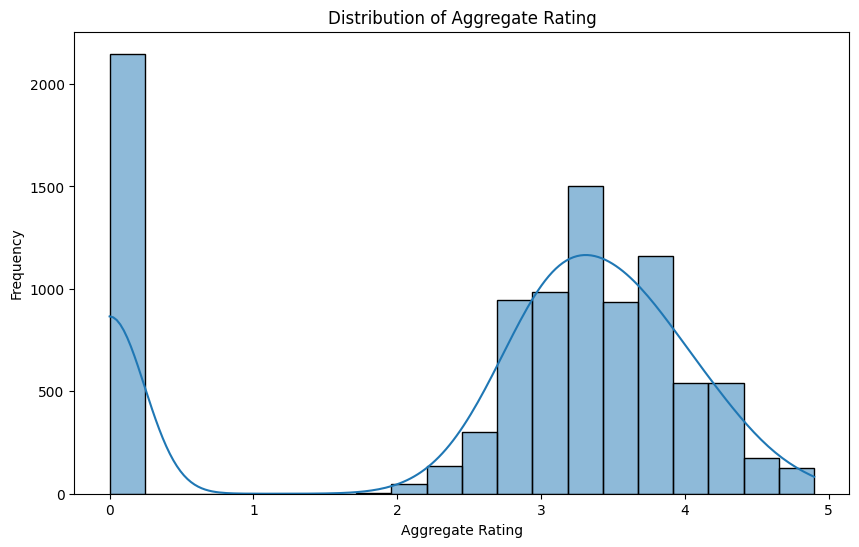

In [11]:
# Distribution plot
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'].dropna(), bins=20, kde=True)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

In [12]:
# Identify Class Imbalances
bins = [0, 2, 4, 6, 8, 10]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
df['Rating Category'] = pd.cut(df['Aggregate rating'], bins=bins, labels=labels)
print(df['Rating Category'].value_counts())

Rating Category
Low          6279
Medium       1114
Very Low       10
High            0
Very High       0
Name: count, dtype: int64


C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


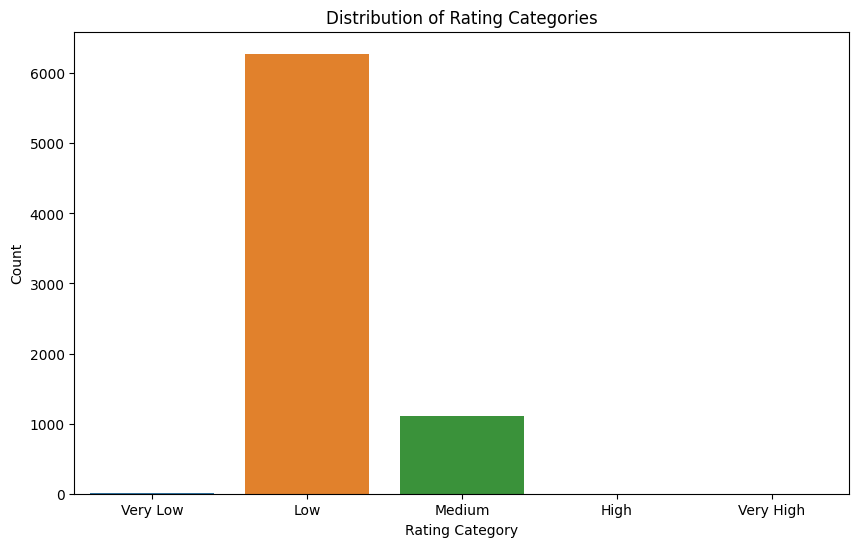

In [13]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Rating Category', order=labels)
plt.title('Distribution of Rating Categories')
plt.xlabel('Rating Category')
plt.ylabel('Count')
plt.show()

# Descriptive Analysis

In [14]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Rating Category
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Medium
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Medium
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Medium
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Medium
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Medium


In [15]:
# Numerical Analysis:
numerical_stats = df.describe()
print(numerical_stats)

       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000  
25%              250.000000     1.000000        

In [16]:
# Calculate for single Column "Aggregate rating":
mean_rating = df['Aggregate rating'].mean()
median_rating = df['Aggregate rating'].median()
std_rating = df['Aggregate rating'].std()
print(f"Mean: {mean_rating}, Median: {median_rating}, Standard Deviation: {std_rating}")

Mean: 2.66637001361114, Median: 3.2, Standard Deviation: 1.5163775396521686


In [17]:
# Categorical Analysis:
country_distribution = df['Country Code'].value_counts()
print(country_distribution)

Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


In [18]:
city_distribution = df['City'].value_counts()
print(city_distribution)
print('*' * 100)
top_cities = df['City'].value_counts().head(10)
print("Top 10 Cities:\n", top_cities)

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64
****************************************************************************************************
Top 10 Cities:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [19]:
cuisine_distribution = df['Cuisines'].value_counts()
print(cuisine_distribution)
print('*' * 100)
top_cuisines = df['Cuisines'].value_counts().head(10)
print('Top 10 Cuisines:\n', top_cuisines)

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64
****************************************************************************************************
Top 10 Cuisines:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354


#  Geospatial Analysis

In [20]:
# Visualize Restaurant Locations on a Map:
# Create a Base Map
Map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Add Points for each Res:
for idx, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(Map)

Map

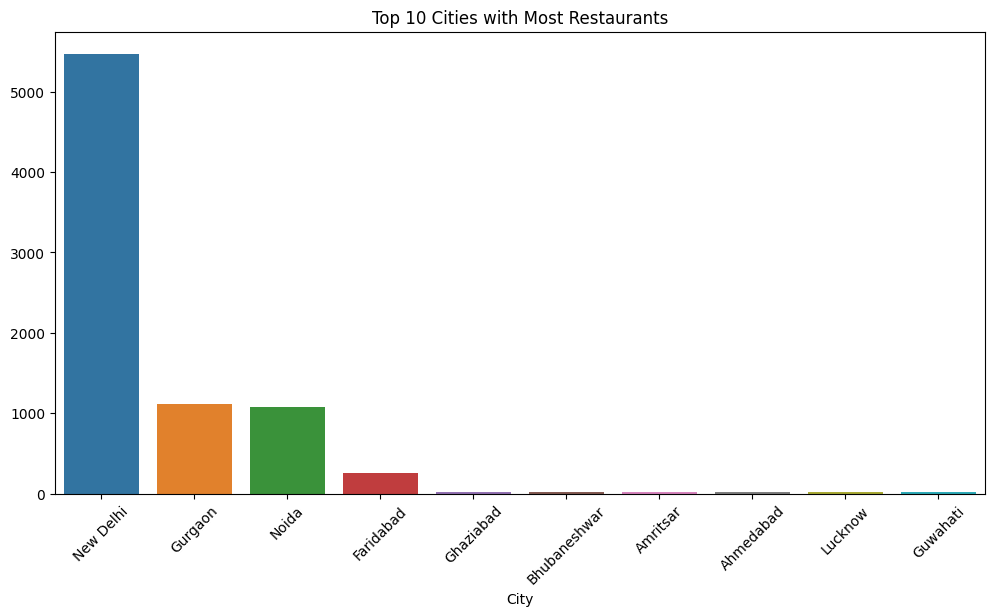

In [21]:
# Analyze Distribution Accross Cities
plt.figure(figsize=(12, 6))
city_dist = df['City'].value_counts().head(10)
sns.barplot(x=city_dist.index, y=city_dist.values)
plt.xticks(rotation=45)
plt.title('Top 10 Cities with Most Restaurants')
plt.show()

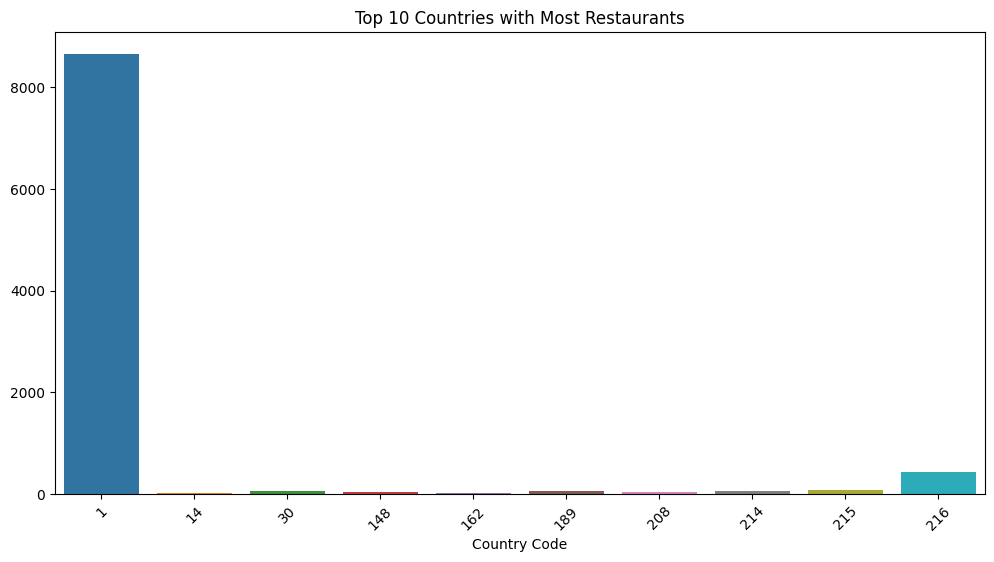

In [22]:
# Analyze Distribution Accross Countries
plt.figure(figsize=(12, 6))
city_dist = df['Country Code'].value_counts().head(10)
sns.barplot(x=city_dist.index, y=city_dist.values)
plt.xticks(rotation=45)
plt.title('Top 10 Countries with Most Restaurants')
plt.show()

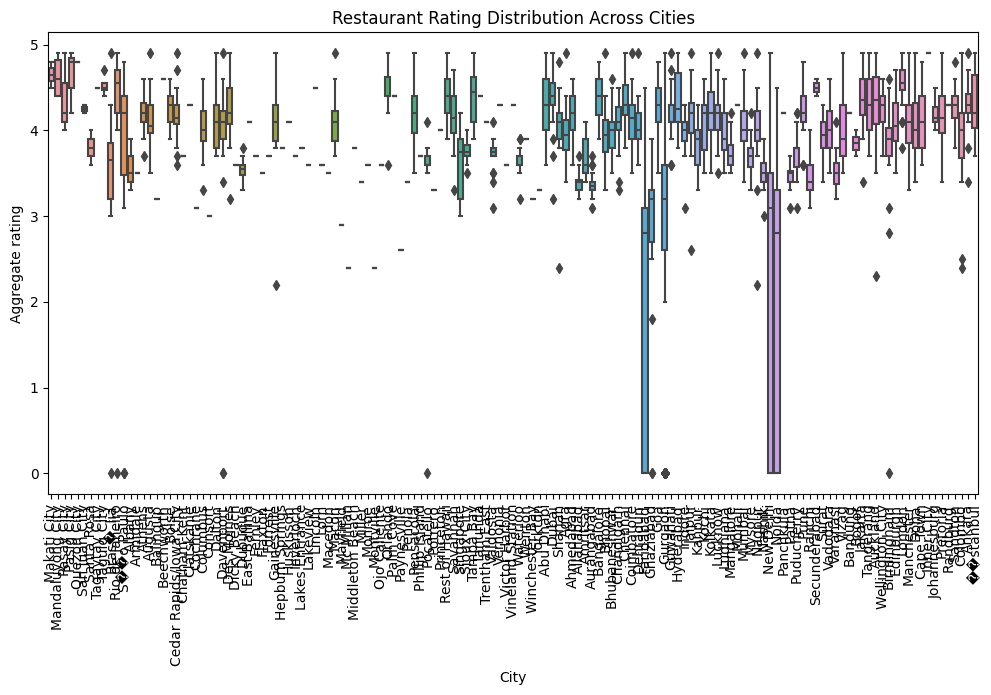

In [23]:
# Correlation Between Location and Rating
# Correaltion Between City and Rating
plt.figure(figsize=(12, 6))
sns.boxplot(x='City', y='Aggregate rating', data=df)
plt.xticks(rotation=90)
plt.title("Restaurant Rating Distribution Across Cities")
plt.show()

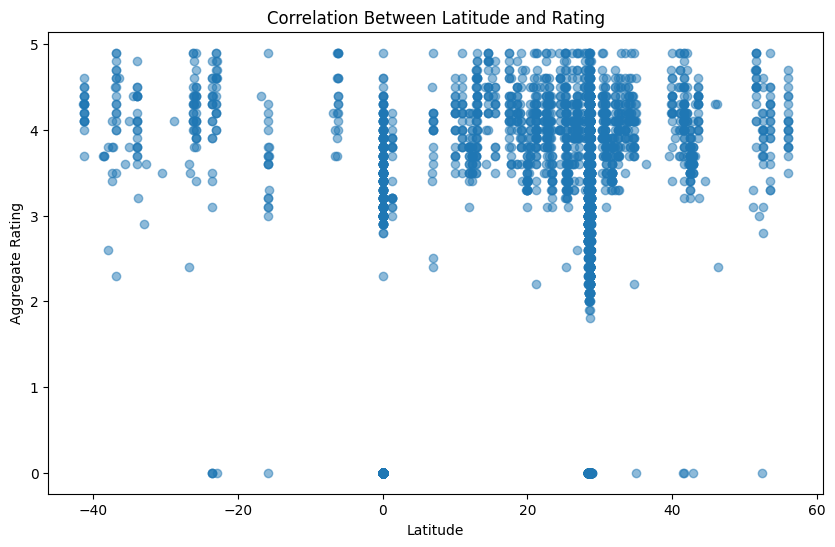

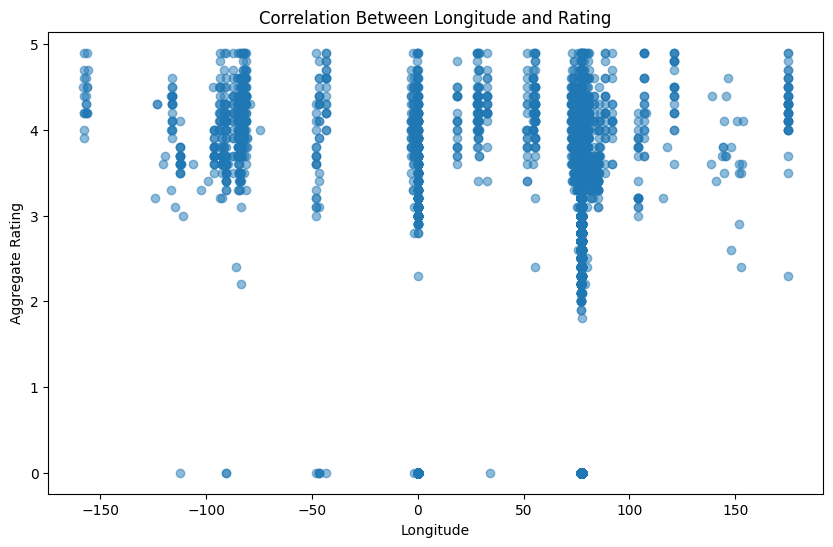

In [24]:
# Correlation Between Latitude/Longitude and Rating:
plt.figure(figsize=(10, 6))

# Scatter plot between latitude and rating
plt.scatter(df['Latitude'], df['Aggregate rating'], alpha=0.5)
plt.title("Correlation Between Latitude and Rating")
plt.xlabel("Latitude")
plt.ylabel("Aggregate Rating")
plt.show()

plt.figure(figsize=(10, 6))

# Scatter plot between longitude and rating
plt.scatter(df['Longitude'], df['Aggregate rating'], alpha=0.5)
plt.title("Correlation Between Longitude and Rating")
plt.xlabel("Longitude")
plt.ylabel("Aggregate Rating")
plt.show()

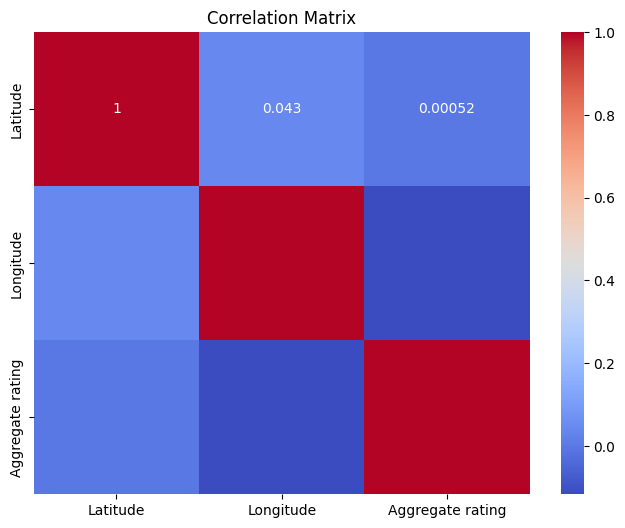

In [25]:
# Heatmap for Correlation:
plt.figure(figsize=(8, 6))
sns.heatmap(df[['Latitude', 'Longitude', 'Aggregate rating']].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# Level Two

In [26]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Rating Category
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Medium
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Medium
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Medium
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Medium
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Medium


#  Table Booking and Online Delivery

In [28]:
# Table Booking & Online Delivery
table_booking = (df['Has Table booking'].value_counts(normalize=True)*100).get('Yes', 0)
table_delivery = (df['Has Online delivery'].value_counts(normalize=True)*100).get('Yes', 0)

print(f"Percentage of restaurants that offer table booking: {table_booking:.2f}%")
print(f"Percentage of restaurants that offer online delivery: {table_delivery:.2f}%")

Percentage of restaurants that offer table booking: 12.12%
Percentage of restaurants that offer online delivery: 25.66%


In [30]:
# Average Ratings with and without table booking
avg_rating = df.groupby('Has Table booking')['Aggregate rating'].mean()

print(f"With Table Booking: {avg_rating.get('Yes', 0):.2f}")
print(f"Without Table Booking: {avg_rating.get('No', 0):.2f}")

With Table Booking: 3.44
Without Table Booking: 2.56


In [31]:
# Analyze the availability of online delivery among restaurants with different price ranges
online_delivery_by_price = df[df['Has Online delivery'] == 'Yes'].groupby('Price range').size()
total_by_price = df.groupby('Price range').size()

online_delivery_percentage_by_price = (online_delivery_by_price / total_by_price * 100).fillna(0)
print(online_delivery_percentage_by_price)

Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
dtype: float64


# Price Range Analysis

In [33]:
# Most Common Price Range
most_common_price_range = df['Price range'].mode()[0]
print(f'The Most Common Price Range is: {most_common_price_range}')

The Most Common Price Range is: 1


In [34]:
# Cal the Avg rating for each Price Range
avg_rating_by_price = df.groupby('Price range')['Aggregate rating'].mean()

print('Average ratings for each price range: ')
print(avg_rating_by_price)

Average ratings for each price range: 
Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


In [35]:
# Identify the color that represents the highest average rating among different price ranges
highest_avg_rating_range = avg_rating_by_price.idxmax()
highest_avg_rating_color = df[df['Price range'] == highest_avg_rating_range]['Rating color'].mode()[0]

print(f"The price range with the highest average rating is: {highest_avg_rating_range}")
print(f"The color representing the highest average rating is: {highest_avg_rating_color}")

The price range with the highest average rating is: 4
The color representing the highest average rating is: Yellow


# Feature Engineering

In [36]:
# Extract the length of restaurant name and address
df['Name Length'] = df['Restaurant Name'].apply(len)
df['Address Length'] = df['Address'].apply(len)

print(df[['Restaurant Name', 'Name Length', 'Address', 'Address Length']].head())

          Restaurant Name  Name Length  \
0        Le Petit Souffle           16   
1        Izakaya Kikufuji           16   
2  Heat - Edsa Shangri-La           22   
3                    Ooma            4   
4             Sambo Kojin           11   

                                             Address  Address Length  
0  Third Floor, Century City Mall, Kalayaan Avenu...              71  
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67  
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56  
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70  
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64  


In [38]:
# Create New Features: "Table Booking" and "Online Delivery"
df['Table Booking'] = df['Has Table booking'].apply(lambda x: 1 if x == 'Yes' else 0)
df['Online Delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

print(df[['Table Booking', 'Has Table booking', 'Online Delivery', 'Has Online delivery']].head())

   Table Booking Has Table booking  Online Delivery Has Online delivery
0              1               Yes                0                  No
1              1               Yes                0                  No
2              1               Yes                0                  No
3              0                No                0                  No
4              1               Yes                0                  No


# Level 3

In [39]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Price range,Aggregate rating,Rating color,Rating text,Votes,Rating Category,Name Length,Address Length,Table Booking,Online Delivery
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,3,4.8,Dark Green,Excellent,314,Medium,16,71,1,0
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,3,4.5,Dark Green,Excellent,591,Medium,16,67,1,0
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,4,4.4,Green,Very Good,270,Medium,22,56,1,0
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,4,4.9,Dark Green,Excellent,365,Medium,4,70,0,0
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,4,4.8,Dark Green,Excellent,229,Medium,11,64,1,0


# Predictive Modeling

In [41]:
# Data Preprocessing
df = df.dropna(subset=['Aggregate rating'])
# df.fillna(0, inplace=True)

# Select Features
features = ['Name Length', 'Address Length', 'Table Booking', 'Online Delivery', 'Price range']
X = df[features]
y = df['Aggregate rating']

In [43]:
# Split Dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [46]:
# Model Builting
# 1 ==> Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_perd_lr = lr_model.predict(X_test)
mse_lr = mean_squared_error(y_test, y_perd_lr)
r2_lr = r2_score(y_test, y_perd_lr)
print(f"Linear Regression MSE: {mse_lr:.2f}, R-squared: {r2_lr:.2f}")

Linear Regression MSE: 1.74, R-squared: 0.23


In [51]:
# 2 ==> Decision Tree:
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
print(f"Decision Tree MSE: {mse_dt:.2f}, R-squared: {r2_dt:.2f}")

Decision Tree MSE: 2.80, R-squared: -0.23


In [50]:
# 3 ==> Random Forest:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"Random Forest MSE: {mse_rf:.2f}, R-squared: {r2_rf:.2f}")

Random Forest MSE: 2.18, R-squared: 0.04


In [52]:
# Comparison of Model 
print(f"Linear Regression: MSE = {mse_lr:.2f}, R² = {r2_lr:.2f}")
print(f"Decision Tree: MSE = {mse_dt:.2f}, R² = {r2_dt:.2f}")
print(f"Random Forest: MSE = {mse_rf:.2f}, R² = {r2_rf:.2f}")

Linear Regression: MSE = 1.74, R² = 0.23
Decision Tree: MSE = 2.80, R² = -0.23
Random Forest: MSE = 2.18, R² = 0.04


# Customer Preference Analysis

In [53]:
# Relationship Between Cuisine Type and Rating
df['Cuisines'] = df['Cuisines'].str.split(', ')
df_exploded = df.explode('Cuisines')
cuisine_rating = df_exploded.groupby('Cuisines')['Aggregate rating'].mean()
print("Average rating for each cuisine:")
print(cuisine_rating.sort_values(ascending=False).head())

Average rating for each cuisine:
Cuisines
Sunda        4.900000
B�_rek       4.700000
Taiwanese    4.650000
Ramen        4.500000
Dim Sum      4.466667
Name: Aggregate rating, dtype: float64


In [54]:
# Most popular Cuisines Based on Votes
cuisine_votes = df_exploded.groupby('Cuisines')['Votes'].sum()
print("Most popular cuisines based on number of votes:")
print(cuisine_votes.sort_values(ascending=False).head())

Most popular cuisines based on number of votes:
Cuisines
North Indian    595981
Chinese         364351
Italian         329265
Continental     288255
Fast Food       184058
Name: Votes, dtype: int64


In [55]:
# Determine if Specific Cuisines Receive Higher Ratings
highly_rated_cuisines = cuisine_rating.sort_values(ascending=False)
print("Cuisines that tend to receive higher ratings:")
print(highly_rated_cuisines.head())

Cuisines that tend to receive higher ratings:
Cuisines
Sunda        4.900000
B�_rek       4.700000
Taiwanese    4.650000
Ramen        4.500000
Dim Sum      4.466667
Name: Aggregate rating, dtype: float64


# Data Visualization

C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


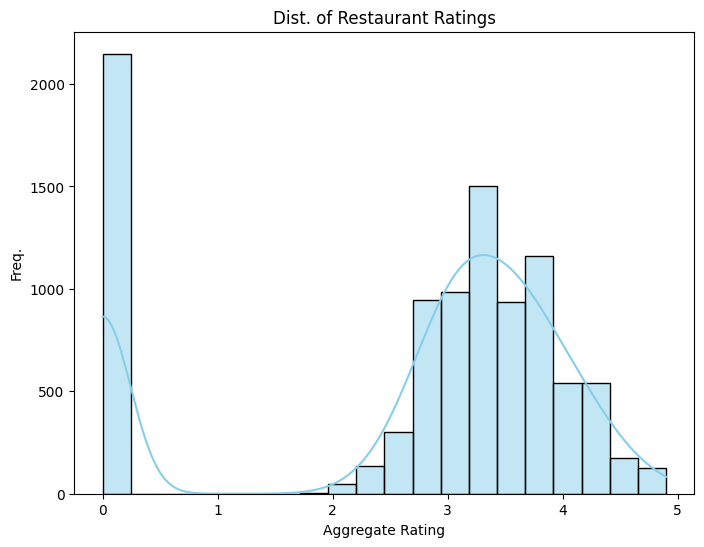

In [59]:
# Visualize the Dist of Ratings
# 1 ==> Histogram
plt.figure(figsize=(8, 6))
sns.histplot(df['Aggregate rating'], bins = 20, kde=True, color='skyblue')
plt.title('Dist. of Restaurant Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Freq.')
plt.show()

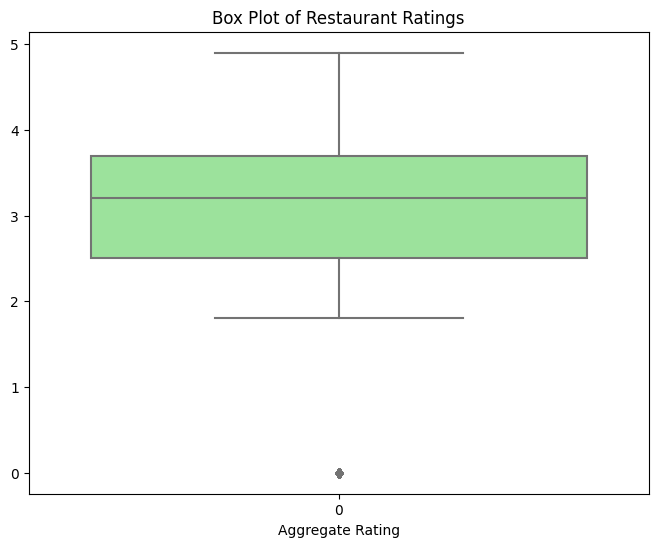

In [60]:
# 2 ==> Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(df['Aggregate rating'], color='lightgreen')
plt.title('Box Plot of Restaurant Ratings')
plt.xlabel('Aggregate Rating')
plt.show()

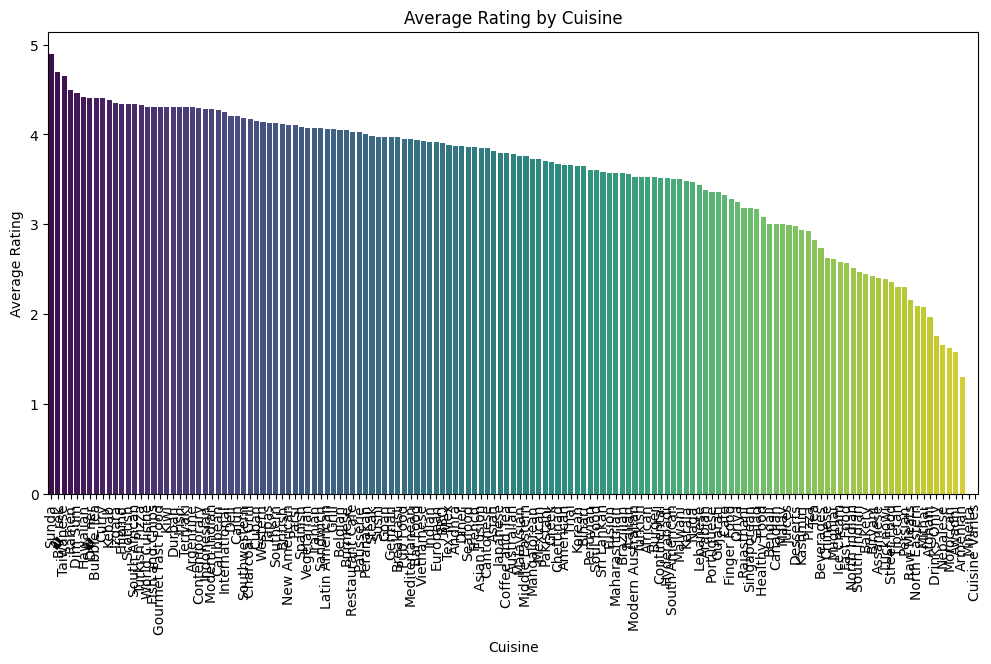

In [61]:
# Compare Average Ratings of Different Cuisines or Cities
# 1 ==> Bar Plot: Average Rating by Cuisine
avg_rating_by_cuisine = df_exploded.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_rating_by_cuisine.index, y=avg_rating_by_cuisine.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Average Rating by Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.show()

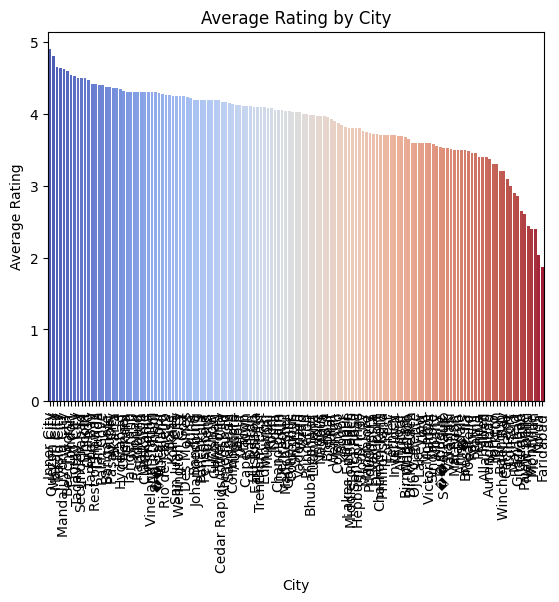

In [63]:
# 2 ==> Bar Plot: Average Rating by City
avg_rating_by_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
sns.barplot(x=avg_rating_by_city.index, y=avg_rating_by_city.values, palette='coolwarm')
plt.xticks(rotation=90)
plt.title('Average Rating by City')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.show()

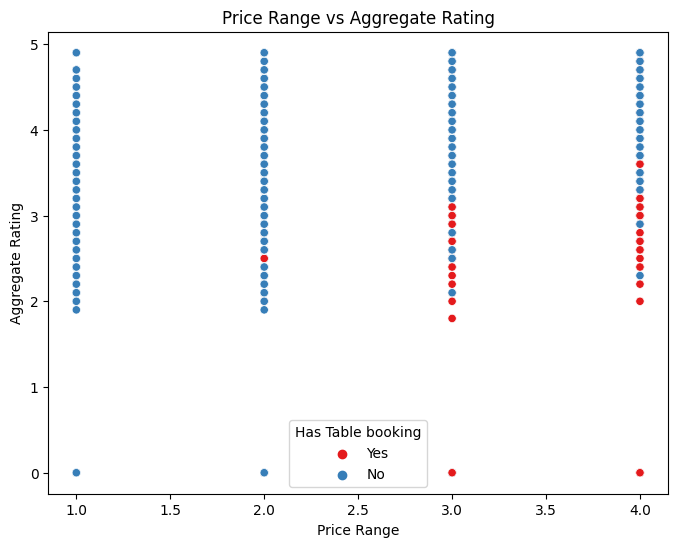

In [64]:
# Visualize Relationships Between Various Features and Ratings
# 1 ==> Scatter Plot: Price Range vs Rating
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Price range', y='Aggregate rating', data=df, hue='Has Table booking', palette='Set1')
plt.title('Price Range vs Aggregate Rating')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.show()

C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\M S I\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


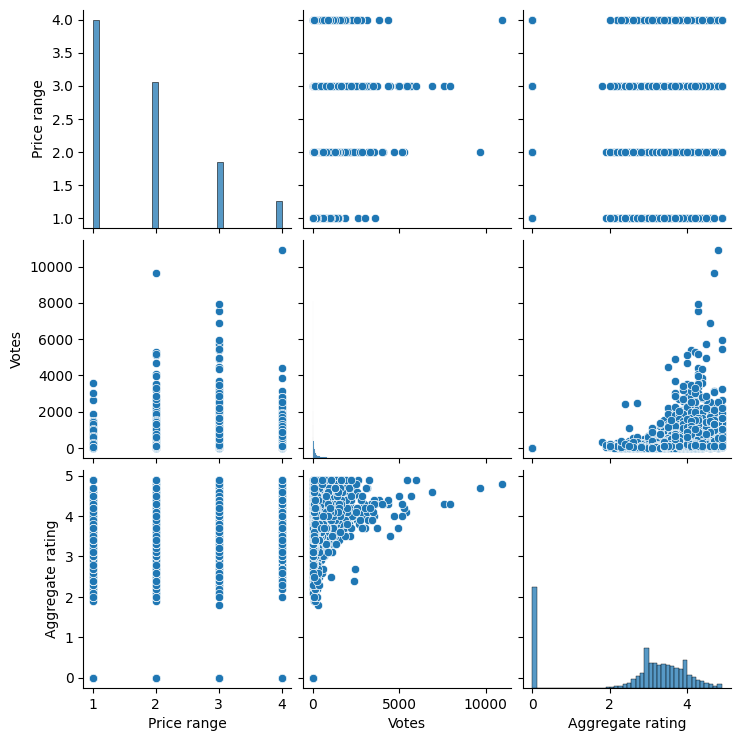

In [65]:
# 2 ==> Pair Plot: Multiple Features and Rating
sns.pairplot(df[['Price range', 'Votes', 'Aggregate rating', 'Has Table booking', 'Has Online delivery']])
plt.show()